In [57]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

In [1]:
import numpy as np 
import csv
import matplotlib
import matplotlib.pyplot as plt
import os
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

plt.rcParams['font.size'] = '14'
plt.rcParams["font.family"] = "Times New Roman"

def gpm2ms(data):
    return 1*data/15850.323
def f2k(data):
    return (data + 459.67)* 5/9
def psig2pa(data):
    return(6894.75728*data)

data = np.genfromtxt('sim_data/simlong_2P_diff.csv', delimiter=',')[1:,:]
data = data.astype(np.float32)

data_inputs1 = np.genfromtxt('data/2power/u23/unit2_cleaned.csv', delimiter=',')[1:,:]
data_inputs1 = data_inputs1.astype(np.float32)

data_inputs2 = np.genfromtxt('data/2power/u23/unit3_cleaned.csv', delimiter=',')[1:,:]
data_inputs2 = data_inputs2.astype(np.float32)


with open('sim_data/simlong_2P_diff.csv', 'r') as infile:
    reader = csv.DictReader(infile)
    header= reader.fieldnames
header_sim = [key for key in header]


with open('data/2power/u23/unit2_cleaned.csv', 'r') as infile:
    reader = csv.DictReader(infile)
    header= reader.fieldnames
header_inputs = [key for key in header]

inputs = [2,4,6,15,23]
header_input = [header_inputs[key] for key in inputs]

inputs = [0]

ttotal_n = 8000
ttrain_n = 7000

output1 = [7,8,12,14,0,2,10]
header_u1 = [header_sim[key] for key in output1]
output2 = [7,9,13,14,1,3,10]
header_u2 = [header_sim[key] for key in output2]

data1 = np.hstack([data_inputs1[:,inputs],data[:,output1]])
data2 = np.hstack([data_inputs2[:,inputs],data[:,output2]])

pos = data2[:,3]>500

data1 = data1[pos,:] 
data2 = data2[pos,:] 

data1 = data1[:8000,:]
data2 = data2[:8000,:]

data_all = np.vstack([data1,data2])
scaler = MinMaxScaler()
scaler.fit(data_all)
data1n = scaler.transform(data1)
data2n = scaler.transform(data2)

train1 = data1n[:ttrain_n,:]
train2 = data2n[:ttrain_n,:]

test1 = data1n[ttrain_n:,:]
test2 = data2n[ttrain_n:,:]

In [3]:
data1n[:,2]

array([0.09431481, 0.17966199, 0.08952177, ..., 0.24892926, 0.249084  ,
       0.24877465])

In [60]:
header_u2

['brinein_T',
 'brinein_m2',
 'pumpspeed2',
 'AmbientT',
 'gross_p2',
 'pumpcost2',
 'brineout_T']

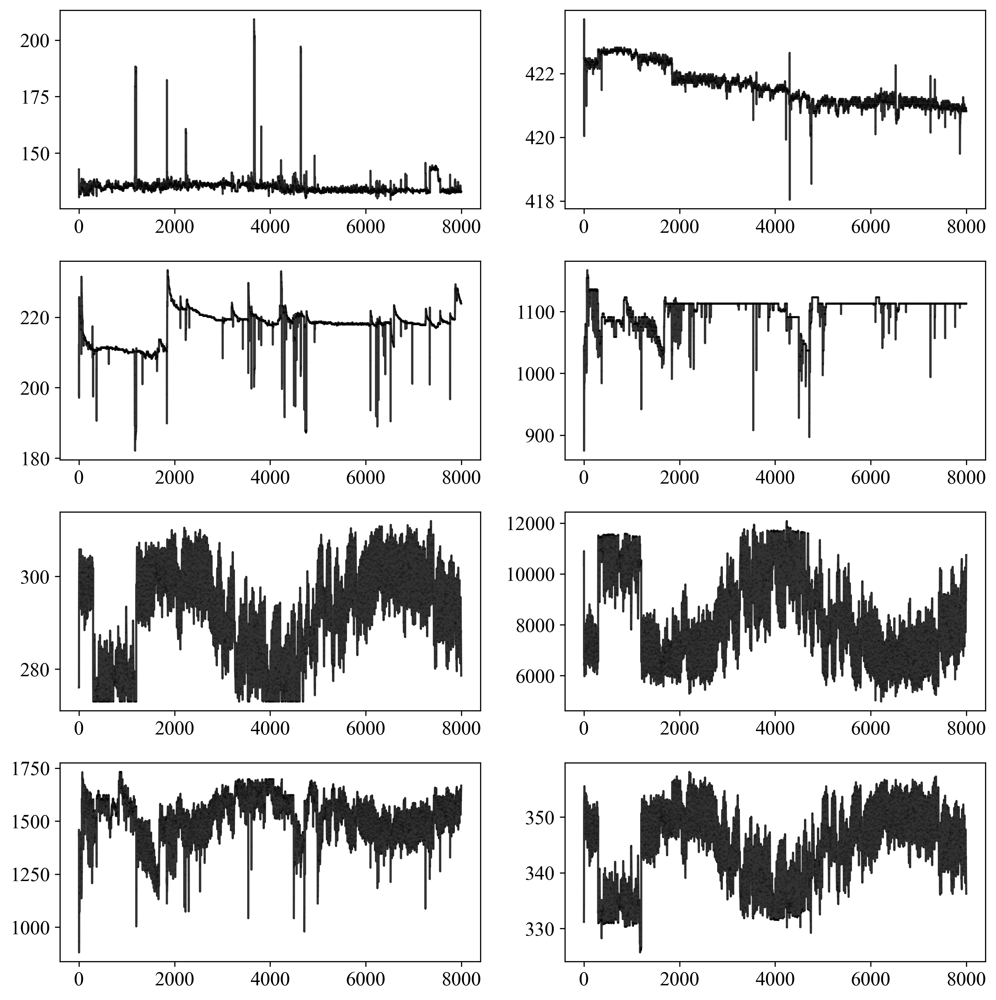

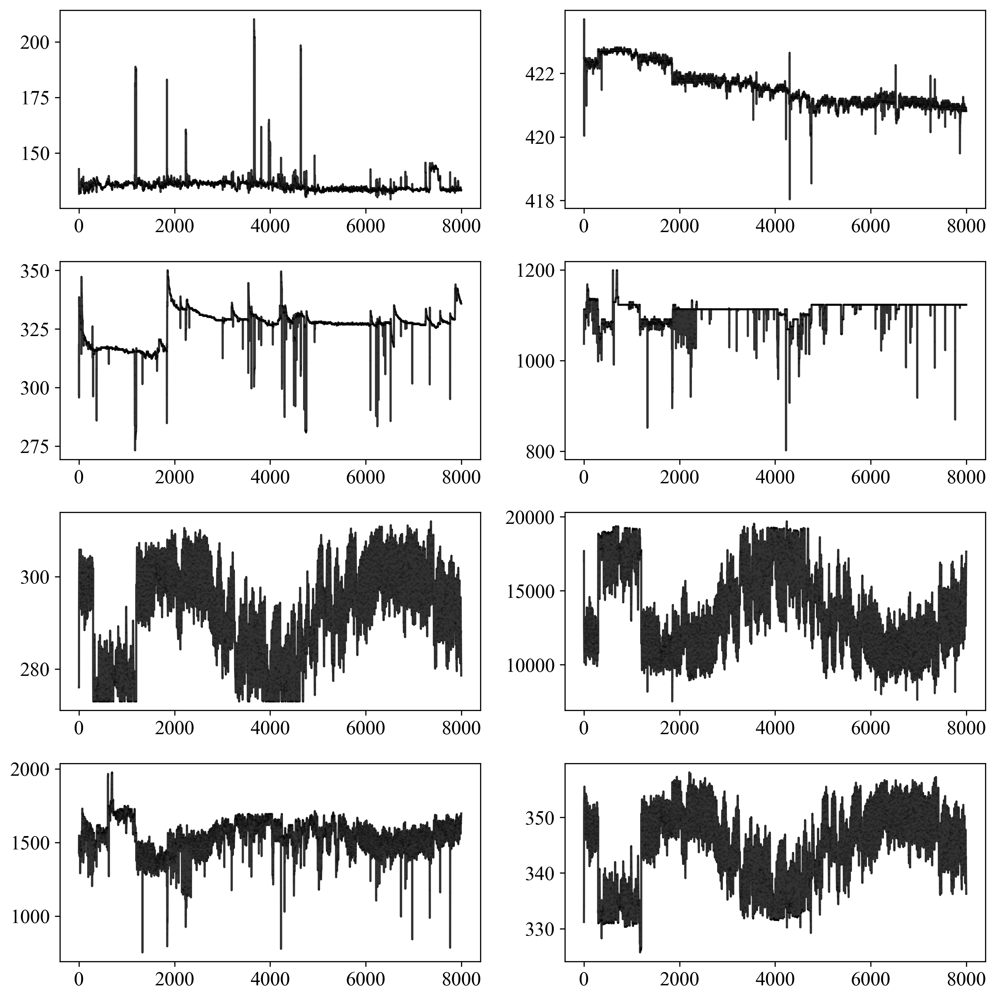

In [61]:
def plot_data_orignal(train):
    n1 =len(train)
#     n2 = n1+len(test)
    ncols = 2
    nrows = 4
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 10))
    axesf = axes.flatten()
    
    for j in range(train.shape[1]):
            ax1 = axesf[j]
            ax1.plot(train[:,j], color='black', marker='o', markersize=0.1, label='Train' , alpha=0.8)
#             ax1.plot(range(n1,n2),test[:,j], color='blue', marker='o', markersize=0.1, label='Test', alpha=0.8)          
#             ax1.set_title(header[j], fontsize =15)
 
    fig.tight_layout()
    
# header = ['Brine T','Brine Q','Pump speed','Ambient T','Power Gen','Pump cost']
plot_data_orignal(data1) 
plot_data_orignal(data2)

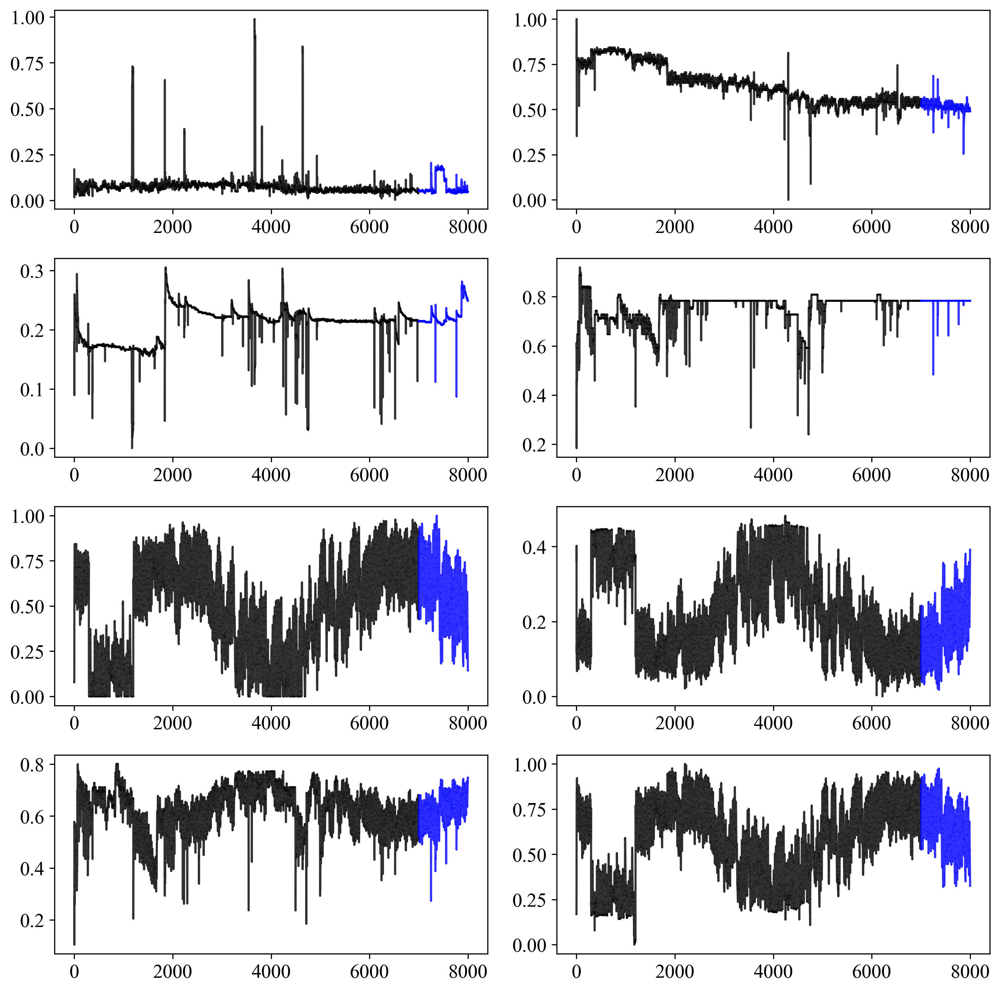

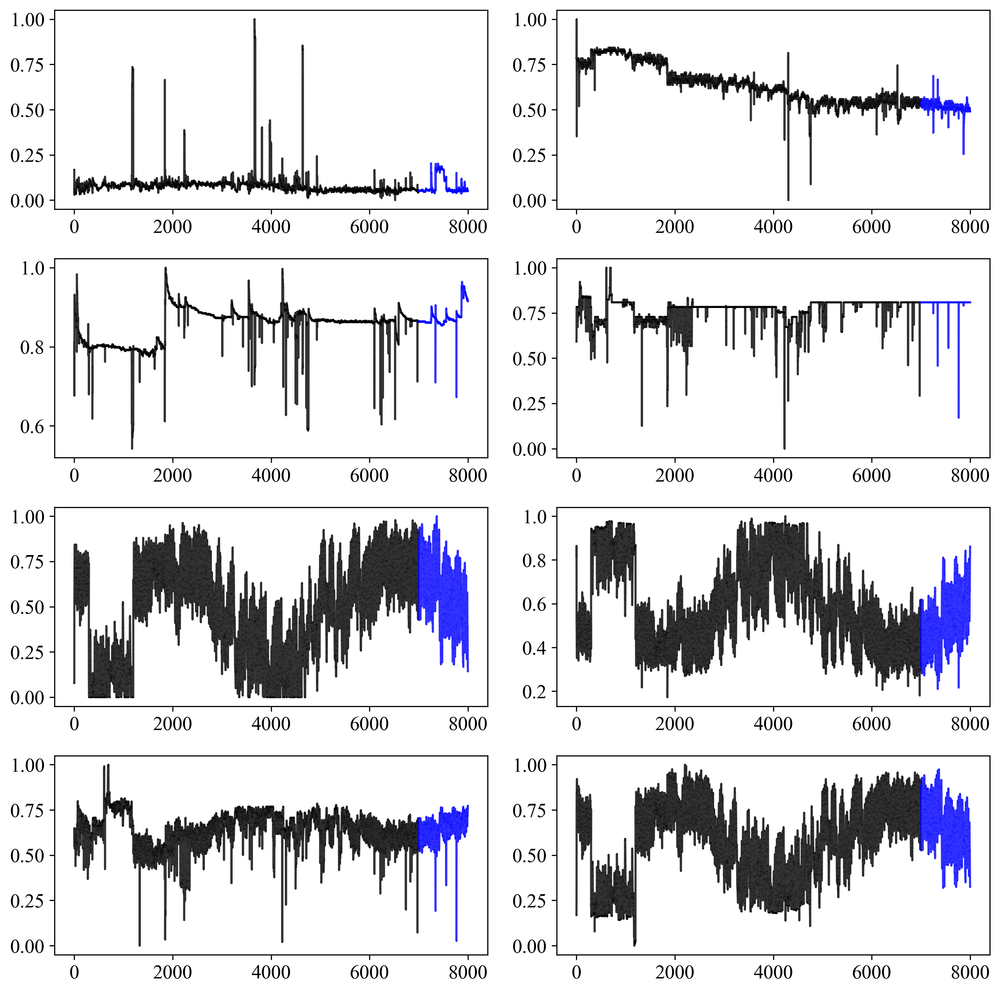

In [62]:
def plot_data(train,  test):
    n1 =len(train)
    n2 = n1+len(test)
    ncols = 2
    nrows = 4
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 10))
    axesf = axes.flatten()
    
    for j in range(train.shape[1]):
            ax1 = axesf[j]
            ax1.plot(train[:,j], color='black', marker='o', markersize=0.1, label='Train' , alpha=0.8)
            ax1.plot(range(n1,n2),test[:,j], color='blue', marker='o', markersize=0.1, label='Test', alpha=0.8)          
#             ax1.set_title(header[j], fontsize =15)
 
    fig.tight_layout()
    
# header = ['Brine T','Brine Q','Pump speed','Ambient T','Power Gen','Pump cost']
plot_data(train1,test1 ) 
plot_data(train2,test2 )


In [63]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import time

class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(5, 10)  # 5*5 from image dimension
        self.fc2 = nn.Linear(10, 20)
        self.fc3 = nn.Linear(20, 3)
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    

In [64]:

header = ['brine_p','brine_t','brine_q','pump speed','ambient T','Power','Cost']
# np.random.seed(11111)
# torch.manual_seed(11111)
# train = train1
# test = test1
# Train = True
# modelname ='Unit1.pt'

# trainlen= len(train)
# device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')   # use GPU if available
# net = Net()   # transfer model to GPU if available
# net = net.train()   # set model in train mode (eg batchnorm params get updated)
# if True:
#     criterion = nn.MSELoss()   
#     train_it = 0
#     best_loss = 100
#     batch_size = 16
#     epochs = 100
#     val_loss = []
#     rec_loss = []
#     vallen = int(trainlen*0.7)
#     for ep in range(epochs):
#         opt = optim.Adam(net.parameters(), lr=0.01)    
#         # np.random.seed(int(time.time()))
#         trainl = np.arange(len(train))
#         np.random.shuffle(trainl)
#         int(trainlen*0.7)
#         traintemp = train[trainl[:vallen],:] 
#         val = train[trainl[vallen:],:] 
#         val = torch.from_numpy(val)
#         traintemp = torch.from_numpy(traintemp)
# #             print("Run Epoch {}".format(ep))

#         Trains = torch.utils.data.DataLoader(traintemp,batch_size=batch_size)    

#         for Train in Trains:
#             train_x = Train[:,:5]
#             train_y = Train[:,5:]
#             opt.zero_grad()
#             outputs = net(train_x)
#             # loss
#             total_loss = criterion(outputs, train_y)

#             # backward
#             total_loss.backward()
#             # update the weights
#             opt.step()

#             if train_it % 1000 == 0:
#                 print("It {}: Reconstruction Loss: {}".format(train_it, total_loss))
#             train_it += 1


#         val_output = net(val[:,:5]) 
#         val_loss1 = criterion(val_output,val[:,5:])
#         val_loss.append(val_loss1)
#         train_output = net(traintemp[:,:5])
#         total_loss = criterion(train_output, traintemp[:,5:])
#         rec_loss.append(total_loss)

# #             print("It {}: Validation Loss: {}".format(ep, val_loss1))
#         if val_loss1 < best_loss:
#             torch.save(net.state_dict(), 'dlmodel_his/simpower2_diff/'+modelname)
#             best_loss = val_loss1

# # np.random.seed(11111)
# # torch.manual_seed(11111)
# train = train2
# test = test2
# Train = True
# modelname ='Unit2.pt'
# device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')   # use GPU if available
# net = Net()   # transfer model to GPU if available
# net = net.train()   # set model in train mode (eg batchnorm params get updated)
# if True:
# #             opt = optim.Adam(net.parameters(), lr=lr_c)       # create optimizer instance
#     criterion = nn.MSELoss()   
#     train_it = 0
#     best_loss = 100
#     batch_size = 16
#     epochs = 100
#     val_loss = []
#     rec_loss = []
#     vallen = int(trainlen*0.7)
#     for ep in range(epochs):
#         opt = optim.Adam(net.parameters(), lr=0.01)    
#         # np.random.seed(int(time.time()))
#         trainl = np.arange(len(train))
#         np.random.shuffle(trainl)
#         int(trainlen*0.7)
#         traintemp = train[trainl[:vallen],:] 
#         val = train[trainl[vallen:],:] 
#         val = torch.from_numpy(val)
#         traintemp = torch.from_numpy(traintemp)
# #             print("Run Epoch {}".format(ep))

#         Trains = torch.utils.data.DataLoader(traintemp,batch_size=batch_size)    

#         for Train in Trains:
#             train_x = Train[:,:5]
#             train_y = Train[:,5:]
#             opt.zero_grad()
#             outputs = net(train_x)
#             # loss
#             total_loss = criterion(outputs, train_y)

#             # backward
#             total_loss.backward()
#             # update the weights
#             opt.step()

#             if train_it % 1000 == 0:
#                 print("It {}: Reconstruction Loss: {}".format(train_it, total_loss))
#             train_it += 1


#         val_output = net(val[:,:5]) 
#         val_loss1 = criterion(val_output,val[:,5:])
#         val_loss.append(val_loss1)
#         train_output = net(traintemp[:,:5])
#         total_loss = criterion(train_output, traintemp[:,5:])
#         rec_loss.append(total_loss)

# #             print("It {}: Validation Loss: {}".format(ep, val_loss1))
#         if val_loss1 < best_loss:
#             torch.save(net.state_dict(), 'dlmodel_his/simpower2_diff/'+modelname)
#             best_loss = val_loss1


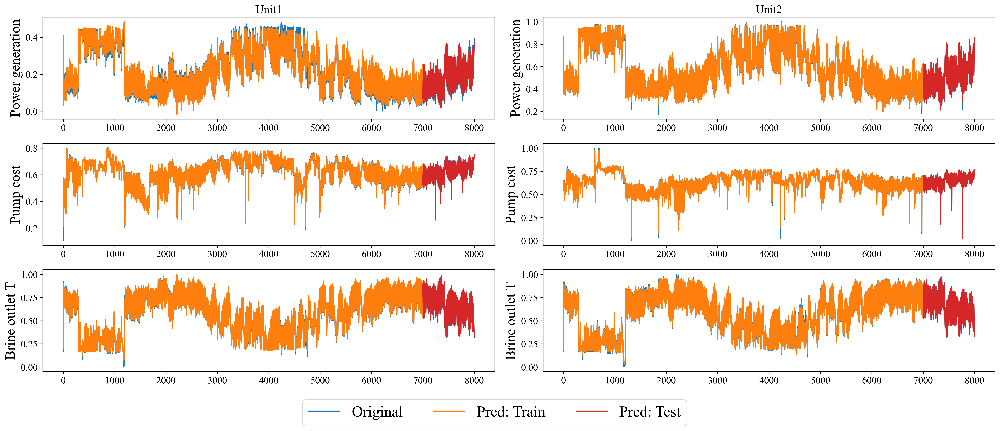

In [65]:
header_new = ['Power generation','Pump cost','Brine outlet T']
unitname=['Unit1','Unit2']

datanew1 = np.vstack([train1,test1])
datanew2 = np.vstack([train2,test2])

net1 = Net()
net1.load_state_dict(torch.load( 'dlmodel_his/simpower2_diff/'+'Unit1.pt'))
net1.eval() 
test1_newx = torch.from_numpy(datanew1[:,:5])
pred1 = net1(test1_newx).detach().numpy()
test1y = datanew1[:,5:]

net2 = Net()
net2.load_state_dict(torch.load( 'dlmodel_his/simpower2_diff/'+'Unit2.pt'))
net2.eval() 
test2_newx = torch.from_numpy(datanew2[:,:5])
pred2 = net2(test2_newx).detach().numpy()
test2y = datanew2[:,5:]



fig, axes = plt.subplots(3, 2, figsize=(20, 8))
for i in range(3):
    axes[i,0].plot(test1y[:,i],label ='Original')
    axes[i,0].plot(pred1[:ttrain_n,i],color ='tab:orange',label ='Pred: Train')
    axes[i,0].plot(range(ttrain_n,ttotal_n),pred1[ttrain_n:,i],color ='tab:red',label ='Pred: Test')
    axes[i,0].set_ylabel(header_new[i],fontsize = 20)
    
    axes[i,1].plot(test2y[:,i],label ='Original')
    axes[i,1].plot(pred2[:ttrain_n,i],color ='tab:orange',label ='Pred: Train')
    axes[i,1].plot(range(ttrain_n,ttotal_n),pred2[ttrain_n:,i],color ='tab:red',label ='Pred: Test')
    axes[i,1].set_ylabel(header_new[i],fontsize = 20)
    
for i in range(2):
    axes[0,i].set_title(unitname[i])
    
plt.tight_layout()
axes.flatten()[-2].legend(loc='upper center', bbox_to_anchor=(1, -0.2), ncol=3,fontsize = 22)

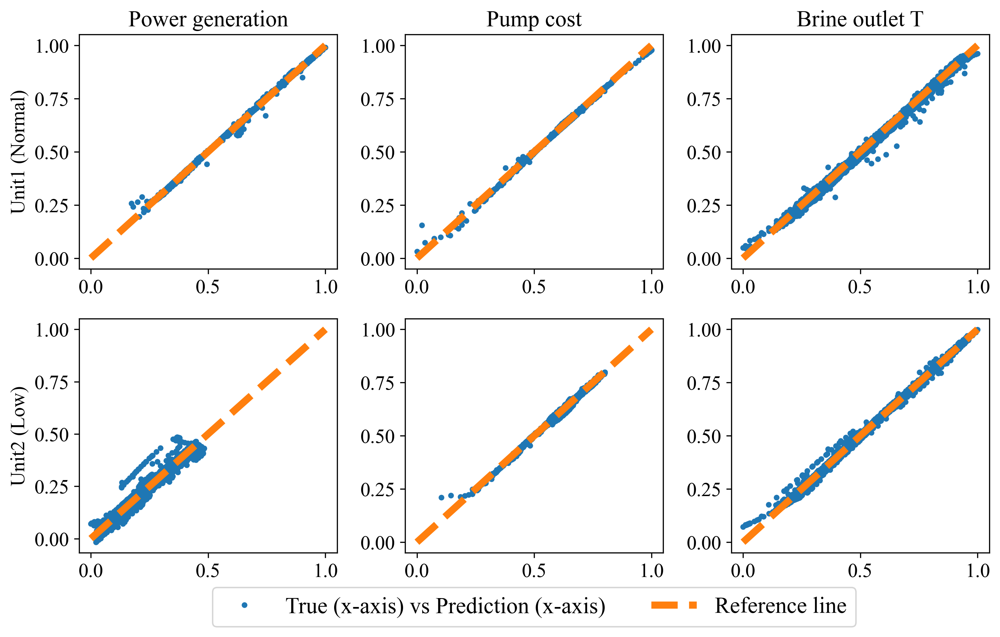

In [66]:
unitname=['Unit1 (Normal)','Unit2 (Low)']
fig, axes = plt.subplots(2, 3, figsize=(10, 6))
for i in range(3):
    axes[0,i].plot(test2y[:ttrain_n,i],pred2[:ttrain_n,i],'.',label ='Prediction vs True')
    axes[0,i].plot([0, 1], [0, 1], ls="--",linewidth = 5, color = 'tab:orange',label ='Reference line')
    # axes[0,i].set_title(unitname[0],fontsize = 20)
    axes[0,i].set_title(header_new[i],fontsize = 16)
    axes[1,i].plot(test1y[:ttrain_n,i],pred1[:ttrain_n,i],'.',label ='True (x-axis) vs Prediction (x-axis)')
    axes[1,i].plot([0, 1], [0, 1], ls="--",linewidth = 5, color = 'tab:orange',label ='Reference line')
    # axes[1,i].set_ylabel(unitname[1],fontsize = 20)
for i in range(2):
    axes[i,0].set_ylabel(unitname[i])
    
plt.tight_layout()
axes.flatten()[-2].legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3,fontsize = 16)

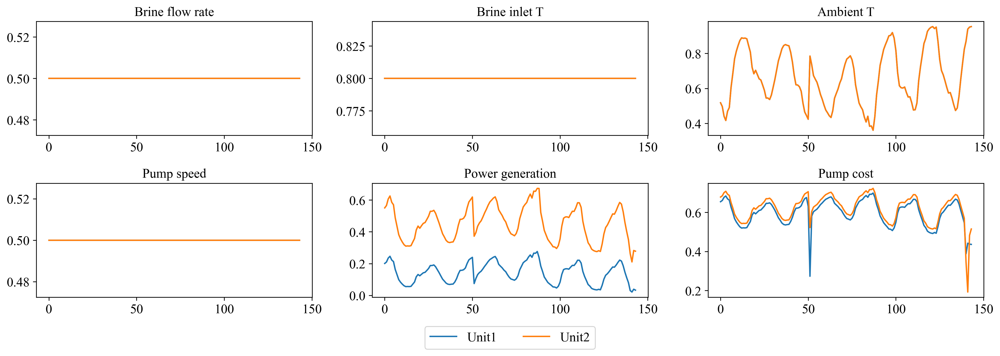

In [67]:
n111 = 200
n_opt = 144
test1n = test1[n111:n111+n_opt]
test2n = test2[n111:n111+n_opt]


test1n[:,1] = 0.8*np.ones([n_opt])
test2n[:,1] = 0.8*np.ones([n_opt])


test1n[:,2] = 0.5*np.ones([n_opt])
test2n[:,2] = 0.5*np.ones([n_opt])
test1n[:,3] = 0.5*np.ones([n_opt])
test2n[:,3] = 0.5**np.ones([n_opt])

fig, axes = plt.subplots(2, 3, figsize=(15, 5))

axes = axes.flatten()

axes[0].plot(test1n[:,2],label = 'Unit1')
axes[0].plot(test2n[:,2],label = 'Unit2')
# axes[0].plot(test3n[:,2],label = 'Unit3')
axes[0].set_title('Brine flow rate',fontsize = 14)
# axes[0].legend()

axes[1].plot(test1n[:,1],label = 'Unit1')
axes[1].plot(test2n[:,1],label = 'Unit2')
# axes[1].plot(test3n[:,1],label = 'Unit3')
axes[1].set_title('Brine inlet T',fontsize = 14)

axes[2].plot(test1n[:,4],label = 'Unit1')
axes[2].plot(test2n[:,4],label = 'Unit2')
# axes[2].plot(test3n[:,7],label = 'Unit3')
axes[2].set_title('Ambient T',fontsize = 14)

axes[3].plot(test1n[:,3],label = 'Unit1')
axes[3].plot(test2n[:,3],label = 'Unit2')
# axes[3].plot(test3n[:,4],label = 'Unit3')
axes[3].set_title('Pump speed',fontsize = 14)

axes[4].plot(test1n[:,5],label = 'Unit1')
axes[4].plot(test2n[:,5],label = 'Unit2')
# axes[4].plot(test3n[:,5],label = 'Unit3')
axes[4].set_title('Power generation',fontsize = 14)

axes[5].plot(test1n[:,6],label = 'Unit1')
axes[5].plot(test2n[:,6],label = 'Unit2')
# axes[5].plot(test3n[:,6],label = 'Unit3')
axes[5].set_title('Pump cost',fontsize = 14)

plt.tight_layout()
axes.flatten()[-2].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=3,fontsize = 14)

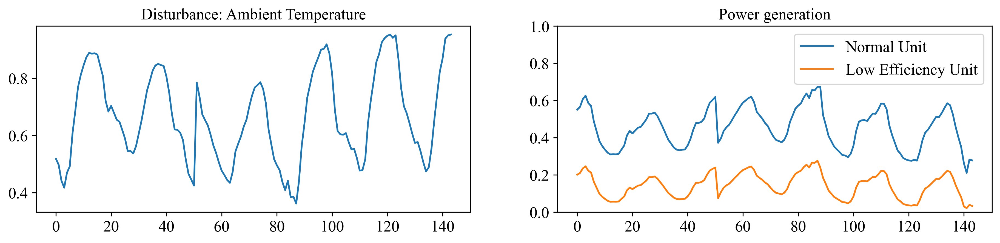

In [68]:
fig, axes = plt.subplots(1, 2, figsize=(15, 3))
axes[0].plot(test1n[:,4],label = 'Unit1')
# axes[2].plot(test3n[:,7],label = 'Unit3')
axes[0].set_title('Disturbance: Ambient Temperature',fontsize = 14)

axes[1].plot(test2n[:,5],label = 'Normal Unit')
axes[1].plot(test1n[:,5],label = 'Low Efficiency Unit')
axes[1].set_title('Power generation',fontsize = 14)
axes[1].set_ylim([0,1])
axes[1].legend()

In [69]:
print(np.sqrt(np.mean((pred1 - test1y)**2, axis=0)))

print(np.sqrt(np.mean((pred2 - test2y)**2, axis=0)))

[0.01689238 0.00445872 0.00937683]
[0.00473577 0.00378852 0.00950395]


| niter |f evals|CG iter|  obj func   |tr radius |   opt    |  c viol  | penalty  |barrier param|CG stop|
|-------|-------|-------|-------------|----------|----------|----------|----------|-------------|-------|
|   1   |   1   |   0   | -1.5032e+04 | 1.00e+00 | 1.07e+03 | 0.00e+00 | 1.00e+00 |  1.00e-01   |   0   |
|   2   |   2   |   1   | -1.7096e+04 | 7.00e+00 | 7.56e+02 | 0.00e+00 | 1.00e+00 |  1.00e-01   |   2   |
|   3   |   3   |   3   | -1.9600e+04 | 1.06e+01 | 7.64e+01 | 2.22e-16 | 1.00e+00 |  1.00e-01   |   4   |
|   4   |   4   |   5   | -2.0172e+04 | 1.17e+01 | 1.39e+01 | 2.22e-16 | 5.22e+02 |  1.00e-01   |   4   |
|   5   |   5   |   8   | -2.0391e+04 | 1.21e+01 | 1.97e+00 | 0.00e+00 | 5.22e+02 |  1.00e-01   |   1   |
|   6   |   6   |  10   | -2.0460e+04 | 1.21e+01 | 6.91e-02 | 0.00e+00 | 5.22e+02 |  1.00e-01   |   4   |
|   7   |   7   |  12   | -2.0472e+04 | 1.21e+01 | 2.52e-04 | 0.00e+00 | 5.22e+02 |  1.00e-01   |   4   |
|   8   |   8   |  14   | -2.0472e+04 | 1.21e+

d:\anaconda3\envs\DL\lib\site-packages\scipy\optimize\_hessian_update_strategy.py:182: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  warn('delta_grad == 0.0. Check if the approximated '


|  37   |  54   |  48   | -2.0473e+04 | 8.48e-05 | 2.40e-04 | 0.00e+00 | 1.00e+00 |  1.60e-04   |   2   |
|  38   |  56   |  49   | -2.0473e+04 | 4.24e-05 | 2.40e-04 | 0.00e+00 | 1.00e+00 |  1.60e-04   |   2   |
|  39   |  58   |  50   | -2.0473e+04 | 2.12e-05 | 2.40e-04 | 0.00e+00 | 1.00e+00 |  1.60e-04   |   2   |
|  40   |  60   |  51   | -2.0473e+04 | 1.06e-05 | 2.40e-04 | 0.00e+00 | 1.00e+00 |  1.60e-04   |   2   |
|  41   |  62   |  52   | -2.0473e+04 | 5.30e-06 | 2.40e-04 | 0.00e+00 | 1.00e+00 |  1.60e-04   |   2   |
|  42   |  64   |  53   | -2.0473e+04 | 2.65e-06 | 2.40e-04 | 0.00e+00 | 1.00e+00 |  1.60e-04   |   2   |
|  43   |  66   |  54   | -2.0473e+04 | 1.32e-06 | 2.40e-04 | 0.00e+00 | 1.00e+00 |  1.60e-04   |   2   |
|  44   |  68   |  55   | -2.0473e+04 | 6.62e-07 | 2.40e-04 | 0.00e+00 | 1.00e+00 |  1.60e-04   |   2   |
|  45   |  70   |  56   | -2.0473e+04 | 3.31e-07 | 2.40e-04 | 0.00e+00 | 1.00e+00 |  1.60e-04   |   2   |
|  46   |  72   |  57   | -2.0473e+04 | 1.66e-

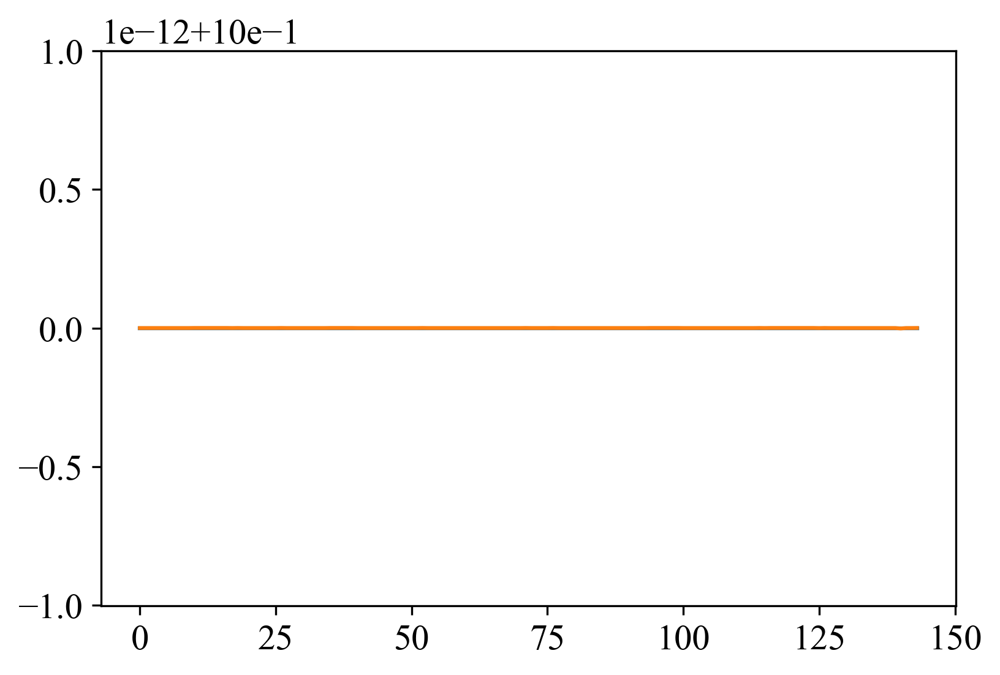

In [70]:
from scipy.optimize import minimize, Bounds, SR1
from scipy import optimize
from scipy.optimize import rosen, differential_evolution
import scipy

tmp = torch.tensor(scaler.data_max_-scaler.data_min_)
data_min = torch.tensor(scaler.data_min_)
# scaler = joblib.load(scaler_filename)
# net.load_state_dict(torch.load('./history/model_all1.pt'))
# net = net.eval()


class OPT():
    def __init__(self, inputs, step):
        self.x = np.copy(inputs)
        self.step = step

    def renew(self, i):
        self.iter = i
        self.inputs = self.x[i:i+step, :]
#         print(self.inputs.shape)

    def objfun(self, x):

        self.inputs[:, 2] = x[0]
        self.inputs[:, 7] = x[1]
        self.inputs[:, 3] = x[2]
        self.inputs[:, 8] = x[3]

        inputs = torch.tensor(self.inputs, requires_grad=True)

        ##
        pars = torch.tensor(mpc.inputs, requires_grad=True)
        net1 = Net()
        net1.load_state_dict(torch.load('dlmodel_his/simpower2_diff/'+'Unit1.pt'))
        net1.eval()
        net2 = Net()
        net2.load_state_dict(torch.load('dlmodel_his/simpower2_diff/'+'Unit2.pt'))
        net2.eval()

        result1 = net1(pars[:, :5])
        result2 = net2(pars[:, 5:10])
        result1 = result1*tmp[-3:]+data_min[-3:]
        result2 = result2*tmp[-3:]+data_min[-3:]
        res = -(result1[:, 0]+result2[:, 0]+-result1[:, 1]-result2[:, 1])
        res.backward()
        return res.detach().numpy(), pars.grad.data[0, [2, 7, 3, 8]].detach().numpy()


step = 1

b = [[0, 1]]*2+[[0.5, 1]]*2


inputs1 = torch.from_numpy(np.copy(test1n))
inputs2 = torch.from_numpy(np.copy(test2n))
inputs = np.hstack([inputs1[:, :5], inputs2[:, :5]])
totalb = test1n[:, 2]+test2n[:, 2]
mpc = OPT(inputs, step)

result = []
result_fun = []

for i in range(n_opt // step):
    mpc.renew(i*step)

    x0 = [test1n[i, 2], test2n[i, 2], test1n[i, 3], test2n[i, 3]]

    def con(t):
        return t[0] + t[1] - totalb[i]
    cons = {'type': 'eq', 'fun': con}
#     res = minimize(mpc.objfun, x0,jac = 'cs',bounds=b, constraints=cons,options={'ftol': 1e-6,'eps':1e-4})
#     res = minimize(mpc.objfun, x0,jac  = True,bounds=b, constraints=cons,options={'ftol': 1e-8,'eps':1e-8
#                                                                                  ,'gtol':1e-8, 'disp': True})
# #
    # res = minimize(mpc.objfun, x0, jac=True,  method='SLSQP',
    #                bounds=b, constraints=cons,options={'ftol': 1e-6,'eps':1e-6
    #                                                   ,'gtol':1e-6, 'disp': True})

    res = minimize(mpc.objfun, x0, jac=True,  method='trust-constr',
                   bounds=b, constraints=cons,
                   options={'maxiter': 50, 'verbose': 3})
    print(i)
    print(res.success)
    result.extend([res.x]*step)
    result_fun.append(-res.fun)

result = np.array(result).reshape([-1, 4])
plt.plot(test1n[:, 2]+test2n[:, 2])
plt.plot(np.sum(result[:, :2], axis=1))



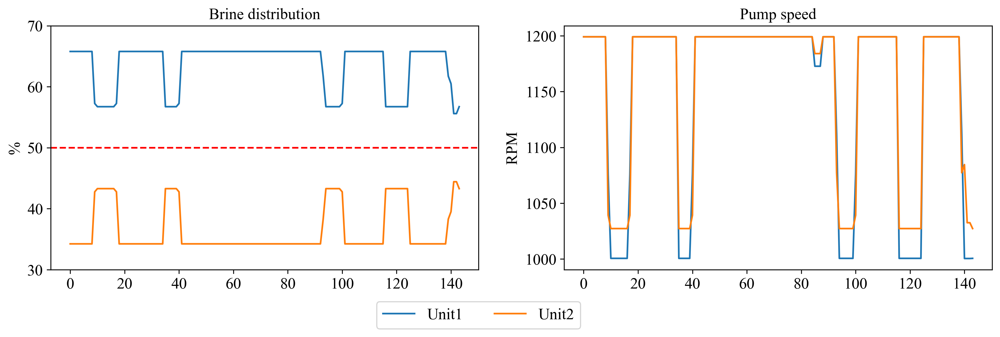

In [72]:
tmp = scaler.data_max_-scaler.data_min_
def transb(brine):
    return brine*tmp[2]+scaler.data_min_[2]

def transpump(pump):
    return pump*tmp[3]+scaler.data_min_[3]

def transpower(power):
    return power*tmp[-4]+scaler.data_min_[-4]
def transcost(cost):
    return cost*tmp[-2]+scaler.data_min_[-2]
b1 = transb(result[:,0])
b2 = transb(result[:,1])

bt = b1+b2

p1 = transpump(result[:,2])
p2 = transpump(result[:,3])


fig, axes = plt.subplots(1, 2, figsize=(15, 4))
axes[0].plot(b2*100/bt,label = 'Unit1')
axes[0].plot(b1*100/bt,label = 'Unit2')

axes[0].axhline(y=50, color='r', linestyle='--')
axes[0].set_ylabel('%')
axes[0].set_ylim([30,70])
axes[0].set_title('Brine distribution',fontsize = 14)
axes[1].plot(p2,label = 'Unit1')
axes[1].plot(p1,label = 'Unit2')


axes[1].set_ylabel('RPM')
axes[1].set_title('Pump speed',fontsize = 14)

# plt.tight_layout()
axes.flatten()[0].legend(loc='upper center', bbox_to_anchor=(1, -0.1), ncol=3,fontsize = 14)

In [ ]:
pred1 = net1(torch.from_numpy(test1n[:,:5])).detach().numpy()
pred2 = net2(torch.from_numpy(test2n[:,:5])).detach().numpy()
recover1 = pred1*tmp[5:]+scaler.data_min_[5:]
recover2 = pred2*tmp[5:]+scaler.data_min_[5:]

net = recover1[:,-3]+recover2[:,-3]-(recover1[:,-2]+recover2[:,-2])
plt.plot(net)
plt.plot(result_fun)


In [ ]:
out_test1 = np.copy(test1n)
out_test2 = np.copy(test2n)


out_test1[:,2] = result[:,0]
out_test2[:,2] = result[:,1]

out_test1[:,3] = result[:,2]
out_test2[:,3] = result[:,3]


out_test1 = scaler.inverse_transform(out_test1)
out_test2 = scaler.inverse_transform(out_test2)


header1 = ['Brine_p']+header_u1


def writeOutput(result, headername, filename):
    result = np.array(result)
    output2 = pd.DataFrame(result,columns=headername)
    output2.to_csv(filename, index=False)
    
writeOutput(out_test1,header1, 'data/2power_diff/Unit1_opt.csv')
writeOutput(out_test2,header1, 'data/2power_diff/Unit2_opt.csv')


out_test1 = np.copy(test1n)
out_test2 = np.copy(test2n)

out_test1[:,1] = 0.8*np.ones([n_opt])
out_test2[:,1] = 0.8*np.ones([n_opt])
out_test1[:,2] = 0.5*np.ones([n_opt])
out_test2[:,2] = 0.5*np.ones([n_opt])
out_test1[:,3] = 0.5*np.ones([n_opt])
out_test2[:,3] = 0.5**np.ones([n_opt])

out_test1 = scaler.inverse_transform(out_test1)
out_test2 = scaler.inverse_transform(out_test2)

writeOutput(out_test1,header1, 'data/2power_diff/Unit1_test.csv')
writeOutput(out_test2,header1, 'data/2power_diff/Unit2_test.csv')


In [ ]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(16, 3))

axes[0].plot(out_test1[:,0],'-')
axes[0].set_ylabel('PSIG')
axes[0].set_title('Brine inlet pressure')

axes[1].plot(out_test1[:,1],'-')
axes[1].set_ylabel('$\degree$K')
axes[1].set_title('Brine inlet temperature')
axes[2].plot(out_test1[:,4],'-')           
axes[2].set_ylabel('$\degree$K')
axes[2].set_title('Ambient temperature')
plt.tight_layout()

452.92372302201966


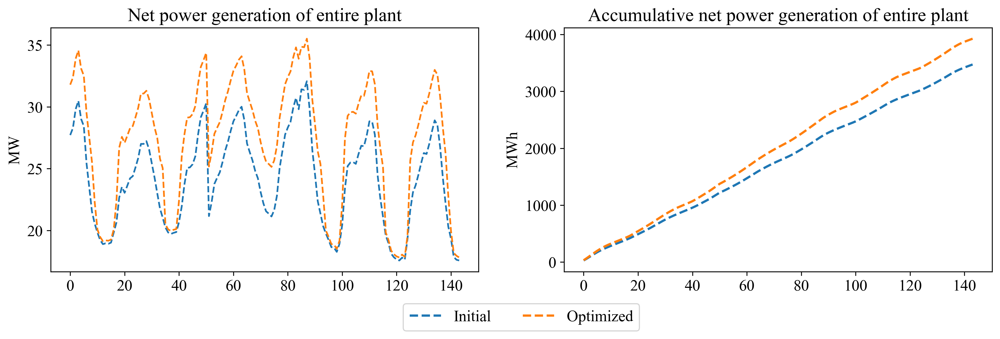

In [56]:
fig, axes = plt.subplots(1, 2, figsize=(15, 4))
data_opt = np.genfromtxt('sim_data2/simlong_diff_opt.csv', delimiter=',')[1:,:]
data_test = np.genfromtxt('sim_data2/simlong_diff_test.csv', delimiter=',')[1:,:]
axes[0].plot(data_test[:,6]/1e3,'--',label ='Initial')
axes[0].plot(data_opt[:,6]/1e3,'--',label ='Optimized')
# plt.legend()
axes[0].set_ylabel('MW')
# plt.legend(loc='upper center', bbox_to_anchor=(1, -0.1), ncol=3,fontsize = 14)
axes[0].set_title('Net power generation of entire plant')

def get_accumulate(data1,data2):
    temp = -data1[:,0]+data2[:,0]+data1[:,1]-data2[:,1]
    temp2 = np.add.accumulate(temp)/1e3
    return temp2
c1 = np.add.accumulate(data_test[:,6])/1e3
c2 = np.add.accumulate(data_opt[:,6])/1e3

axes[1].plot(c1,'--',color = 'tab:blue', linewidth = 2,alpha = 1,label = 'Initial')
axes[1].plot(c2,'--',color = 'tab:orange', linewidth = 2,alpha = 1,label = 'Optimized')
axes[1].set_title('Accumulative net power generation of entire plant')
axes[1].set_ylabel('MWh')
print(c2[-1]-c1[-1])
axes.flatten()[-1].legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), ncol=3,fontsize = 14)

In [ ]:
np.mean((data_opt[:,6] - data_test[:,6])/(data_test[:,6]))

In [73]:
(c2[-1]-c1[-1])/c1[-1]

0.13044607924050639